<a href="https://colab.research.google.com/github/nghweigeok/object-segmentation-pixellib/blob/main/Object_Segmentation_PixelLib.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Object Segmentation in Images and Videos using PixelLib

To return bounding box and segments of images in only five lines of codes.
<br><br>
References for this tutorial: 
- https://www.youtube.com/watch?v=FO-tjmtw5J4
- https://github.com/ayoolaolafenwa/PixelLib
- https://towardsdatascience.com/extraction-of-objects-in-images-and-videos-using-5-lines-of-code-6a9e35677a31


# Install and Import Modules

Enable GPU:
- Method 1: Edit tab --> Notebook settings --> GPU --> Save.
- Method 2: Runtime tab --> Change runtime type --> GPU --> Save.

In [1]:
!pip install tensorflow--gpu pixellib --upgrade

     |████████████████████████████████| 454.3 MB 18 kB/s 
     |████████████████████████████████| 69 kB 10.2 MB/s 
  Created wheel for imantics: filename=imantics-0.1.12-py3-none-any.whl size=16033 sha256=8a73b5072a057179234fd02764c1f4078613b8fa97947843f569bab64614551d
  Stored in directory: /root/.cache/pip/wheels/da/7c/3e/296fe3ed4eb3bd713e91dee0d0549f12f316d49939a64bdc96
Successfully built imantics


In [2]:
import pixellib
from pixellib.instance import instance_segmentation
import matplotlib.pyplot as plt

# Create Instance and Load Pretrained Model

In [3]:
segment_image = instance_segmentation()

- Download the Mask RCNN model at: https://github.com/ayoolaolafenwa/PixelLib/releases/tag/1.2
- Sample image by Paul Kueger from Flickr: https://www.flickr.com/photos/30604571@N00/5862679434/
- Sample video: https://www.youtube.com/watch?v=EivIBccZURA
- Upload them to your Google Drive and mount it to Colab.

In [4]:
!pwd

/content


In [5]:
segment_image.load_model("/content/drive/MyDrive/Datasets/mask_rcnn_coco.h5")

Instructions for updating:
The `validate_indices` argument has no effect. Indices are always validated on CPU and never validated on GPU.
Instructions for updating:
Use fn_output_signature instead


# Object Segmentation from Images

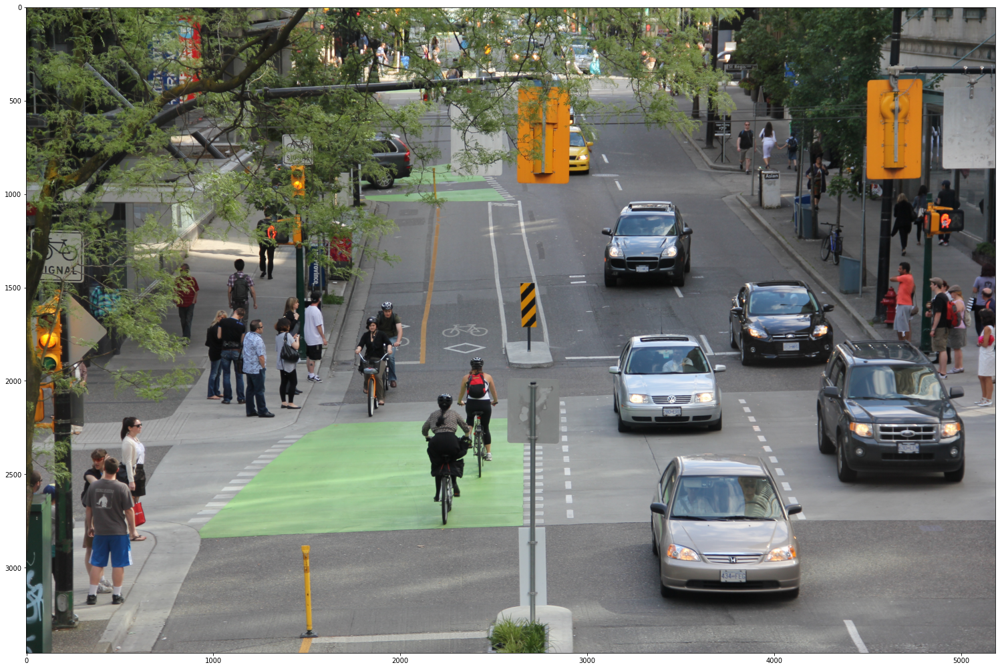

In [6]:
plt.figure(figsize=(26, 18))
im_bike_lane = plt.imread("/content/drive/MyDrive/Datasets/bike-lane.jpg")
plt.imshow(im_bike_lane)

In [7]:
segment_image.segmentImage("/content/drive/MyDrive/Datasets/bike-lane.jpg", 
                           show_bboxes=True, 
                           extract_segmented_objects=False, 
                           save_extracted_objects=False, 
                           output_image_name="/content/drive/MyDrive/Datasets/bike-lane_segmented.jpg")

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:2426: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


Processed image saved successfully in your current working directory.


({'class_ids': array([ 1,  1,  1,  3,  1,  1,  1,  1,  1,  3,  1,  3,  1,  1,  1,  1,  3,
          1,  1,  1,  1,  3,  2, 10,  3,  3,  1,  2,  1,  1,  1, 10, 10,  1,
          1,  1], dtype=int32),
  'masks': array([[[False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False],
          ...,
          [False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False]],
  
         [[False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False],
          ...,
          [False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False]],
  
         [[False, False, False, ..., False, Fa

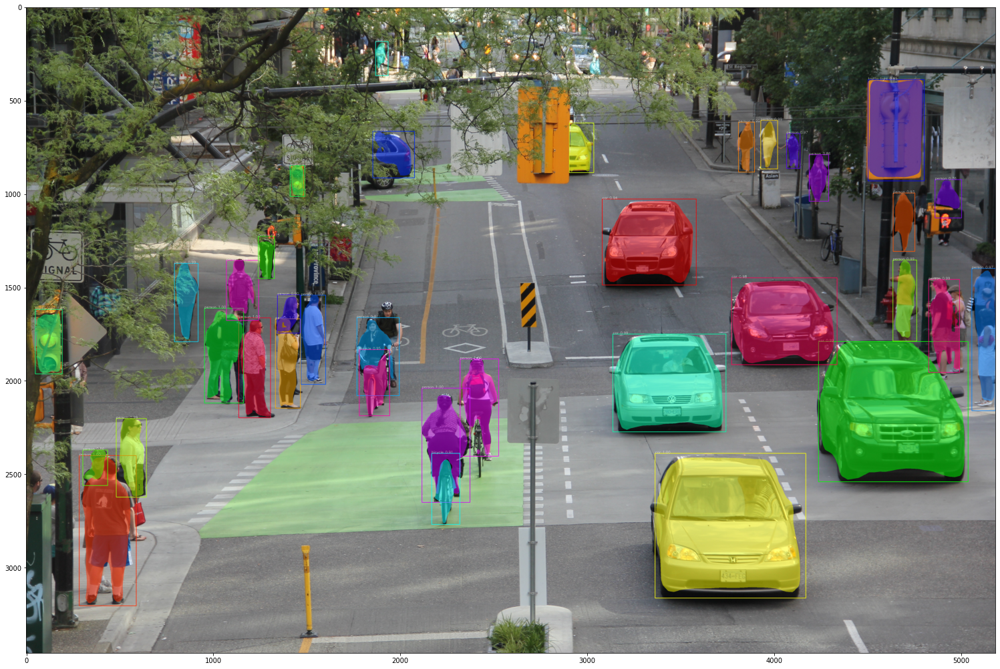

In [8]:
plt.figure(figsize=(26, 18))
im_bike_lane_segmented = plt.imread("/content/drive/MyDrive/Datasets/bike-lane_segmented.jpg")
plt.imshow(im_bike_lane_segmented)

# Segment Objects from Certain Classes

In [9]:
target_classes = segment_image.select_target_classes(person=True)
segment_image.segmentImage("/content/drive/MyDrive/Datasets/bike-lane.jpg", 
                           segment_target_classes=target_classes,
                           show_bboxes=True, 
                           extract_segmented_objects=False, 
                           save_extracted_objects=False, 
                           output_image_name="/content/drive/MyDrive/Datasets/bike-lane_segmented_person.jpg")

Processed image saved successfully in your current working directory.


({'class_ids': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1], dtype=int32),
  'masks': array([[[False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False],
          ...,
          [False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False]],
  
         [[False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False],
          ...,
          [False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False]],
  
         [[False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False],
         

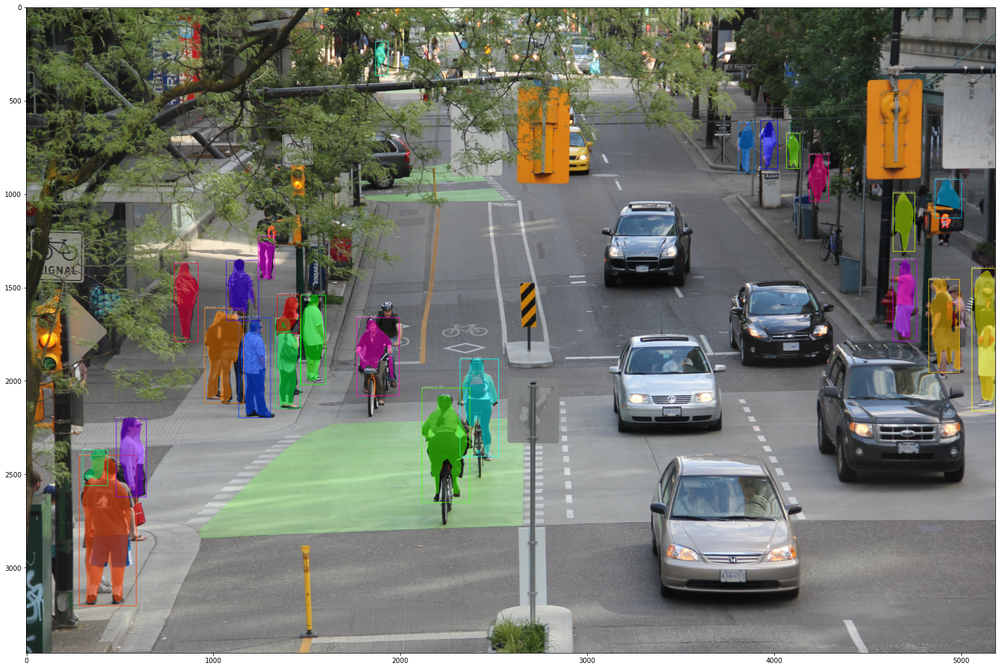

In [10]:
plt.figure(figsize=(26, 18))
im_bike_lane_segmented_person = plt.imread("/content/drive/MyDrive/Datasets/bike-lane_segmented_person.jpg")
plt.imshow(im_bike_lane_segmented_person)

In [11]:
target_classes = segment_image.select_target_classes(car=True, bicycle=True)
segment_image.segmentImage("/content/drive/MyDrive/Datasets/bike-lane.jpg", 
                           segment_target_classes=target_classes,
                           show_bboxes=True, 
                           extract_segmented_objects=False, 
                           save_extracted_objects=False, 
                           output_image_name="/content/drive/MyDrive/Datasets/bike-lane_segmented_car_bicycle.jpg")

Processed image saved successfully in your current working directory.


({'class_ids': array([3, 3, 3, 3, 3, 2, 3, 3, 2], dtype=int32),
  'masks': array([[[False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False],
          ...,
          [False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False]],
  
         [[False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False],
          ...,
          [False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False]],
  
         [[False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False],
    

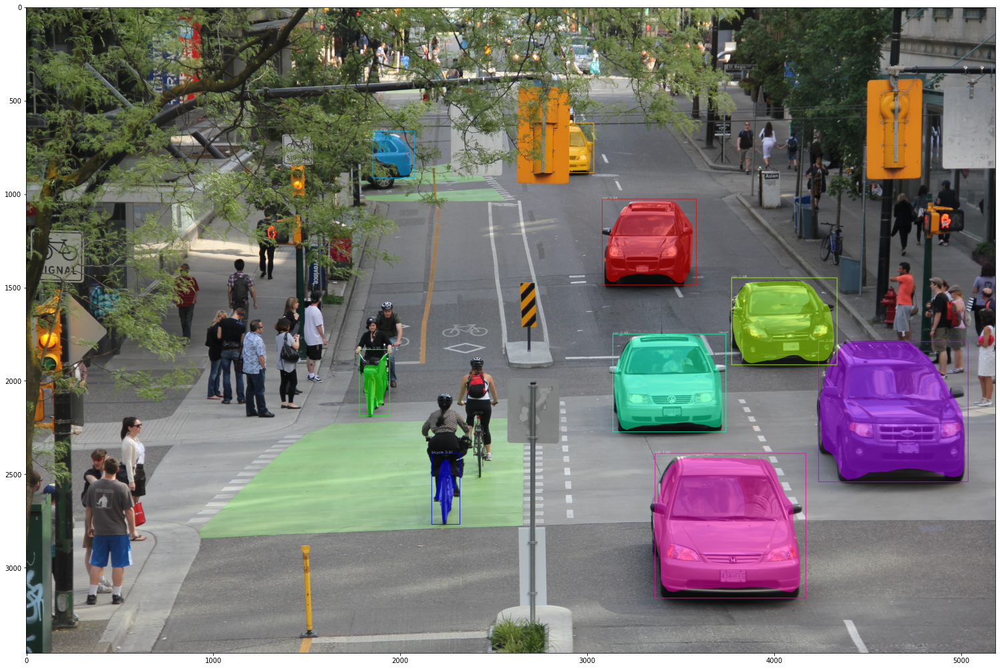

In [12]:
plt.figure(figsize=(26, 18))
im_bike_lane_segmented_car_bicycle = plt.imread("/content/drive/MyDrive/Datasets/bike-lane_segmented_car_bicycle.jpg")
plt.imshow(im_bike_lane_segmented_car_bicycle)

# Object Segmentation from Videos

In [13]:
segment_video = instance_segmentation()
segment_video.load_model("/content/drive/MyDrive/Datasets/mask_rcnn_coco.h5")
segment_video.process_video("/content/drive/MyDrive/Datasets/city-scene.mp4", 
                            show_bboxes=True,  
                            extract_segmented_objects=True,
                            save_extracted_objects=False, 
                            frames_per_second= 5,  
                            output_video_name="/content/drive/MyDrive/Datasets/city-scene_segmented.mp4")

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:2426: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


No. of frames: 1
No. of frames: 2
No. of frames: 3
No. of frames: 4
No. of frames: 5
No. of frames: 6
No. of frames: 7
No. of frames: 8
No. of frames: 9
No. of frames: 10
No. of frames: 11
No. of frames: 12
No. of frames: 13
No. of frames: 14
No. of frames: 15
No. of frames: 16
No. of frames: 17
No. of frames: 18
No. of frames: 19
No. of frames: 20
No. of frames: 21
No. of frames: 22
No. of frames: 23
No. of frames: 24
No. of frames: 25
No. of frames: 26
No. of frames: 27
No. of frames: 28
No. of frames: 29
No. of frames: 30
No. of frames: 31
No. of frames: 32
No. of frames: 33
No. of frames: 34
No. of frames: 35
No. of frames: 36
No. of frames: 37
No. of frames: 38
No. of frames: 39
No. of frames: 40
No. of frames: 41
No. of frames: 42
No. of frames: 43
No. of frames: 44
No. of frames: 45
No. of frames: 46
No. of frames: 47
No. of frames: 48
No. of frames: 49
No. of frames: 50
No. of frames: 51
No. of frames: 52
No. of frames: 53
No. of frames: 54
No. of frames: 55
No. of frames: 56
N

({'class_ids': array([6, 3, 3, 3, 3, 3, 1, 3, 3, 3, 1, 1, 1, 4, 1, 3, 3, 3, 3],
        dtype=int32), 'extracted_objects': array([array([[[0, 0, 0],
          [0, 0, 0],
          [0, 0, 0],
          ...,
          [0, 0, 0],
          [0, 0, 0],
          [0, 0, 0]],
  
         [[0, 0, 0],
          [0, 0, 0],
          [0, 0, 0],
          ...,
          [0, 0, 0],
          [0, 0, 0],
          [0, 0, 0]],
  
         [[0, 0, 0],
          [0, 0, 0],
          [0, 0, 0],
          ...,
          [0, 0, 0],
          [0, 0, 0],
          [0, 0, 0]],
  
         ...,
  
         [[0, 0, 0],
          [0, 0, 0],
          [0, 0, 0],
          ...,
          [0, 0, 0],
          [0, 0, 0],
          [0, 0, 0]],
  
         [[0, 0, 0],
          [0, 0, 0],
          [0, 0, 0],
          ...,
          [0, 0, 0],
          [0, 0, 0],
          [0, 0, 0]],
  
         [[0, 0, 0],
          [0, 0, 0],
          [0, 0, 0],
          ...,
          [0, 0, 0],
          [0, 0, 0],
          

More on PixelLib:
- Live camera instance segmentation
- Custom model detection
